In [9]:
#Copyright@MIT license
#Crane Chen, hchen136@jhu.edu, 09/14/2019
#Pengfei Guo, pguo4@jhu.edu
#This is the demo is for step2, cross-view matching. For results of the complete algorithm, need to run step3 optimization for 3D keypoints before visualization.
import sys
import json
import os
import lap
import numpy as np
from scipy.optimize import linear_sum_assignment
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D
import cv2
import pylab as pl
from numpy import linalg as LA
import random
import math
from mpl_toolkits.mplot3d import axes3d, Axes3D
from pose_optimize.multiview_geo import get_distance
from all_dataset_para import Get_P_from_dataset
from AccomodateDataset import accomoDataset
from VisualizeAll3D import VisualizeAll3D, ThreeDTriangulate,VisualizeAll3D_13

from GetTwoLists_pkg import GetTwoLists, GetProjectLists

from getBoneL import getBones
from pose_optimize.multiview_geo import reconstruct_point_mini
from CopingWithOutlier import CopeOutlier
import warnings
import matplotlib.cbook
from AccomodateAllWildtrack import accomoAllWildtrack

from matplotlib.axes._axes import _log as matplotlib_axes_logger
matplotlib_axes_logger.setLevel('ERROR')

# Visualize the four images

In [10]:
############################## visualize the four images ########################################################
#%matplotlib inline
def show_images(list_r4, list_l4, list_r6, list_l6, list_r_p, list_l_p,images, matched_paris_real_idx,cols = 2,titles = None):
    """Display a list of images in a single figure with matplotlib.
    
    Parameters
    ---------
    images: List of np.arrays compatible with plt.imshow.
    
    cols (Default = 1): Number of columns in figure (number of rows is 
                        set to np.ceil(n_images/float(cols))).
    
    titles: List of titles corresponding to each image. Must have
            the same length as titles.
    """
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        if n == 0 and len(list_l4) != 0 and len(list_r4)!= 0:
            visualize_feet(list_l4,list_r4)
        if n == 1 and len(list_l6) != 0 and len(list_r6)!= 0:
            visualize_feet(list_l6,list_r6)   
        if n == 2 and len(list_l_p) != 0 and len(list_r_p)!= 0:
            visualize_feet(list_l_p,list_r_p)
        if n == 3 and len(matched_paris_real_idx):
            id_6 = [list_l6[i][2] for i in range(len(list_l6))]
            id_p = [matched_paris_real_idx[i][1] for i in range(len(matched_paris_real_idx))]
            dict_matched = { matched_paris_real_idx[i][1]:matched_paris_real_idx[i][0]
                            for i in range(len(matched_paris_real_idx))} 
            visualize_matched_feet(list_l6,list_r6,list_l_p,list_r_p,id_6,id_p,dict_matched)      
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()
    
def visualize_matched_feet(list_l6,list_r6,list_l_p,list_r_p,id_6,id_p,dict_matched):
    number_of_colors = 100
    l_x = []
    l_y = []
    r_x = []
    r_y = []
    running_colors = []
    
    color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
             for i in range(number_of_colors)]
    
    markers = [".",",","o","v","^","<",">","1","2","3","4"]
    
    markers = ["o","o","o","o","o","o","o","o","o","o","o"]
   
    
    count = 0
    count_marker = 0 
    for i in range (0,len(list_l_p)):
        idx = list_l_p[i][2]
        if idx in dict_matched.keys():
            corresponding_idx = dict_matched[idx]
            # project part
            running_color = color[count]   # matched pairs have same color
            running_marker = markers[count_marker]
            plt.scatter(x=list_l_p[i][0], y=Height - list_l_p[i][1], c=running_color, marker = running_marker,s=30)
            plt.scatter(x=list_r_p[i][0], y=Height - list_r_p[i][1], c=running_color, marker = running_marker,s=30)

            # real part
            real_idx = id_6.index(corresponding_idx)
            plt.scatter(x=list_l6[real_idx][0], y=Height - list_l6[real_idx][1], c=running_color, marker = running_marker,s=30)
            plt.scatter(x=list_r6[real_idx][0], y=Height - list_r6[real_idx][1], c=running_color, marker = running_marker,s=30)

            count += 1
            count_marker += 1
            if count_marker == 10:
                count_marker = 0
        
def the_four_images(counter, list_r4, list_l4, list_r6, list_l6, list_r_p, list_l_p,matched_paris_real_idx, image_path4, image_path6, frame_num):
    img_directory4 = image_path4 + '/' + '{0:0=8d}.png'.format(frame_num) 
    img_directory6 = image_path6 + '/' + '{0:0=8d}.png'.format(frame_num) 
    im1 = cv2.imread(img_directory4)
    im2 = cv2.imread(img_directory6)
    im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)
    im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2RGB)
    images = [im1,im2,im2,im2]
    show_images(list_r4, list_l4, list_r6, list_l6, list_r_p, list_l_p, images, matched_paris_real_idx,cols = 2 ,titles = None)

def visualize_feet(list_l,list_r):
    number_of_colors = 100
    l_x = []
    l_y = []
    r_x = []
    r_y = []
    color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
             for i in range(number_of_colors)]
    for counter1 in range (len(list_r)):
        l_x.append(list_l[counter1][0])
        l_y.append(Height - list_l[counter1][1])
        r_x.append(list_r[counter1][0])
        r_y.append(Height - list_r[counter1][1])
    plt.scatter(x=l_x, y=l_y, c=color[0:counter1+1], s=20)
    plt.scatter(x=r_x, y=r_y, c=color[0:counter1+1], s=20)


# Cost function using feet matches

In [11]:
############################ cost function of feet matches ########################################
def cost_function(list_l6,list_r6,list_l_p,list_r_p):
    thresh1 = 200
    thresh3 = 200
    w1_0 = 20
    w2_0 = 2 #angle
    w3_0 = 20 #stride length
    w4_0 = 0
    w1 = w1_0 / (w1_0 + w2_0 + w3_0 + w4_0)
    w2 = w2_0 / (w1_0 + w2_0 + w3_0 + w4_0)
    w3 = w3_0 / (w1_0 + w2_0 + w3_0 + w4_0)
    w4 = w4_0 / (w1_0 + w2_0 + w3_0 + w4_0)
    a = 1e-8
    c = 5e8
    l_o = len(list_l6)
    l_p = len(list_l_p)
    l_m = max(l_o,l_p)
    C = np.ones((l_o, l_p)) * 10
    M_index = np.zeros((l_o, l_p),dtype = object)
    for i in range (0,l_o):
        for j in range (0,l_p):
            M_index[i,j] = str(list_l6[i][2]) + ',' + str(list_l_p[j][2])
            l6 = np.asarray(list_l6[i][0:2]) 
            r6 = np.asarray(list_r6[i][0:2]) 
            l6_p = np.asarray(list_l_p[j][0:2])
            r6_p = np.asarray(list_r_p[j][0:2])
            vo = l6 - r6
            vp = l6_p - r6_p
            po = (l6 + r6) * 0.5
            pp = (l6_p + r6_p) * 0.5
            
            cij1 = LA.norm(po - pp) 
            if cij1 > thresh1:
                cij1 = thresh1
            cij1 = cij1 / thresh1
            
            if LA.norm(vo) == 0.0 or LA.norm(vp) == 0.0:
                cij2 = 0.0
            else:
                cij2 = abs(np.cross(vo,vp))/(LA.norm(vo)*LA.norm(vp)) 
                
            cij3 = abs(LA.norm(vo) - LA.norm(vp)) 
            if cij3 > thresh3:
                cij3 = thresh3
            cij3 = cij3 / thresh3
            
            cij4 = LA.norm(l6 - l6_p) + LA.norm(r6 - r6_p)
            if cij4 > thresh1:
                cij4 = thresh1
            cij4 = cij4 / thresh1
            
            cij = w1 * cij1 + w2 * cij2 + w3 * cij3 + w4 * cij4
            C[i,j] = cij
    return C, M_index


# Graph alignment

In [12]:
############################### Graph alignment ################################################
def graph_alignment(cost_m, M_index,threshold=1):
    '''
    cost_m:  a N by M matrix of corresponding cost (2D)
    
    M_index: a N by M matrix of corresponding annotation id in json (2D)
    
    return: possible (row_ind, col_ind) and real matched annotation id 
            for example 10 match to 4, we finally only can have 4 matched pair
    '''
    
    #paddding to a square
    matched_paris =[]
    size = max(cost_m.shape[0],cost_m.shape[1]) 
    if cost_m.shape.index(size) ==0:
        # we have larger row, so padding col
        new_m = np.pad(cost_m, ((0,0),(0,size-cost_m.shape[1])), 'constant', constant_values=10)   #(up,down)(left,right)
        row_ind, col_ind = linear_sum_assignment(new_m)
        # eliminate those padding matched pairs
        mask_col = col_ind < cost_m.shape[1]
        matched_paris = [(row_ind[i],col_ind[i]) for i in range(size) if mask_col[i] 
                                                                      and cost_m[row_ind[i],col_ind[i]] < threshold]              
             
    else:
        # we have larger col, so padding row
        new_m = np.pad(cost_m, ((0,size-cost_m.shape[0]),(0,0)), 'constant', constant_values=10)   #(up,down)(left,right)
        # row_ind, col_ind = linear_sum_assignment(new_m) # if using LAP from scipy
        _, row_ind, col_ind = lap.lapjv(new_m)
        # eliminate those padding matched pairs
        matched_paris = [(row_ind[i],col_ind[i]) for i in range(size) if i <cost_m.shape[0]
                                                                      and cost_m[row_ind[i],col_ind[i]] < threshold]
   
    matched_paris_real_name =[(M_index[matched_paris[j][0],matched_paris[j][1]]) for j in range(len(matched_paris))]
    matched_paris_real_name = [(int(matched_paris_real_name[i].split(',')[0]),
                                int(matched_paris_real_name[i].split(',')[1]))
                                for i in range(len(matched_paris_real_name))]
    
    
    return matched_paris, matched_paris_real_name

# Triangulation and Visualization in 3D

In [13]:
############################### Triangulation and Visualize 3D ################################################################
def Formkp(anno_num,data_dict,key_c,img_id):
    """
        this function cuts numpy arrays of keypoints from json file
    """
    img_id = '{0:0=8d}.png'.format(img_id)
    for counter in range(anno_num):
        if data_dict[counter]["id"] == key_c:
            kp = data_dict[counter]["keypoints"] #list
            kp = kp[0:2] + kp[3:5] + kp[6:8] + kp[9:11] + kp[12:14] + kp[15:17] + kp[18:20] + kp[21:23] + kp[24:26]\
                 + kp[27:29] + kp[30:32] + kp[33:35] + kp[36:38] + kp[39:41] + kp[42:44] + kp[45:47] + kp[48:50] + kp[51:53]\
                 + kp[54:56] + kp[57:59] + kp[60:62] + kp[63:65] + kp[66:68] 
            kp = (np.asarray(kp)).reshape(23,2)
            kp = kp.T
    return kp

def DataTransfer(match_result, img_id, path1, path2):
    """
        this function takes in a list of tuples for single image which is output by graph_alignment
        output KP4 and KP6 are numpy arrays with the dimension of 2 by n, 
        output match pair is a number
    """
    with open(path1) as json_data:
        data_dict4 = json.load(json_data)
        anno_num4 = len(data_dict4)
    with open(path2) as json_data:
        data_dict6 = json.load(json_data)
        anno_num6 = len(data_dict6)
    match_pair = len(match_result)
    for counter in range(0,match_pair): #loop among different people
        pair = match_result[counter]
        key_c4 = pair[1]
        key_c6 = pair[0]
        kp4 = Formkp(anno_num4,data_dict4,key_c4,img_id) #numpy array
        kp6 = Formkp(anno_num6,data_dict6,key_c6,img_id) #numpy array
        if counter == 0:
            KP4 = kp4
            KP6 = kp6
        else:
            KP4 = np.concatenate((KP4,kp4),axis=1)
            KP6 = np.concatenate((KP6,kp6),axis=1) 
    try:
        KP4.shape
    except:
        KP4 = np.zeros((2,1))
        KP6 = np.zeros((2,1))
    return KP4,KP6,match_pair


# Reprojection error

In [14]:
##################################### reprojection error ####################################################
def Reproject(P,pts3D):
    """
        this function takes in projection matrix of camera and 3D keypoints
        the form of pts3D is 4 by n numpy array, rows 0,1,2 are x,y,z, row2 is always 1
        this functioin returns cordinates of all preprojected points, and the form is 2 by n np array,
    """   
    pts2D_0 = P.dot(pts3D)
    pts2D = (pts2D_0 /pts2D_0 [2,:])[0:2,:]
    return pts2D

def ReprojectError(pts2D,KP):
    """
        this function takes in reprojected points and detected points
        KP format: 2 by n numpy array
        this functioin returns the reprojection error
    """ 
    d = pts2D - KP
    rp_error = LA.norm(d)

    return rp_error

# Main function

In [15]:
###################################### main func #############################################################
def main(path4, path6, image_path4, image_path6, frame_num, H, dataset_name,P4,P6, hung_thresh, edge_thresh):
    with open(path4) as json_data:
        data_dict4 = json.load(json_data)
        anno_num4 = len(data_dict4)
    with open(path6) as json_data:
        data_dict6 = json.load(json_data)
        anno_num6 = len(data_dict6)

    counter = frame_num
    list_r4, list_l4 = GetTwoLists(data_dict4,anno_num4,counter,Width, Height, edge_thresh)
    list_r6, list_l6 = GetTwoLists(data_dict6,anno_num6,counter,Width, Height, edge_thresh)
    list_r_p, list_l_p = GetProjectLists(data_dict4,anno_num4,counter,H,Width, Height, edge_thresh)
    
    C, M_index = cost_function(list_l6,list_r6,list_l_p,list_r_p)
        
    matched_paris, matched_paris_real_idx = graph_alignment(C,M_index, hung_thresh)
    
    img_id = frame_num # be careful here
    match_result = matched_paris_real_idx
    KP4,KP6,match_pair = DataTransfer(match_result,img_id, path4, path6) 
    
    KP4,KP6,match_pair = DataTransfer(match_result,img_id, path4, path6) 

    pts3D = ThreeDTriangulate(P4,P6,KP4,KP6,match_pair)

    f1 = pl.figure(100)
    ax = f1.add_subplot(111, projection='3d')
    pts3D_13 = VisualizeAll3D(pts3D, ax, dataset_name, xlim, ylim, zlim)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    
    
    the_four_images(counter, list_r4, list_l4, list_r6, list_l6, list_r_p, list_l_p, matched_paris_real_idx, image_path4, image_path6, frame_num)
    return KP4, KP6, pts3D



# Visualizing reprojection error

In [16]:
################################ Visualizing Reprojection Error ###########################################
def VisReprojectionError(img_directory1, img_directory3, img_directory4, img_directory6, frame_num, KP1_16, KP6_16,KP1_13, KP3_13, KP4_46, KP6_46, KP3_34, KP4_34, pts3D_16, pts3D_13, pts3D_46, pts3D_34, save_path,P1,P3,P4,P6):
        
    # mild orange and blue
    mild_orange = [255/255,119/255,0]
    mild_blue = [30/255, 144/255, 255/255]
    
    #bright orange and blue
    bright_orange = [255/255,79/255,0]
    bright_blue = [0/255, 229/255, 238/255]
    
    # mild orange and blue cv2
    mild_orange_cv2 = (255,119,0)
    mild_blue_cv2 = (30, 144, 255)
    
    #bright orange and blue cv2
    bright_orange_cv2 = (255,79,0)
    bright_blue_cv2 = (0, 229, 238)
       
    img_directory1 = img_directory1 + '/' + '{0:0=8d}.png'.format(frame_num) 
    img_directory3 = img_directory3 + '/' + '{0:0=8d}.png'.format(frame_num) 
    img_directory4 = img_directory4 + '/' + '{0:0=8d}.png'.format(frame_num) 
    img_directory6 = img_directory6 + '/' + '{0:0=8d}.png'.format(frame_num) 
    
    
    ################################ C4 and C6 #####################################
    pts2D_6 = Reproject(P6,pts3D_46)
    col6 = pts2D_6.shape[1]

    
    f2 = pl.figure(4) 
    im = cv2.imread(img_directory6)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)    
    for i in range (0,col6):
        plt.scatter(x = [KP6_46[0][i]], y = [KP6_46[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'truth46_4'))  
    
    
    f2 = pl.figure(40) 
    im = cv2.imread(img_directory6)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)                 
    for i in range (0,col6):
        plt.scatter(x = [KP6_46[0][i]], y = [KP6_46[1][i]], c = bright_blue, s = 10) #inference result blue
        plt.scatter(x = [pts2D_6[0][i]], y = [pts2D_6[1][i]], c = bright_orange , s = 10) #reprojected orange
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'repro46_4'))
    
    
    pts2D_4 = Reproject(P4,pts3D_46)
    rp_error4 = ReprojectError(pts2D_4,KP4_46)
    col4 = pts2D_4.shape[1]

    f2 = pl.figure(5)
    im = cv2.imread(img_directory4)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)       
    for i in range (0,col4):
        plt.scatter(x = [KP4_46[0][i]], y = [KP4_46[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'truth46_6'))
    
    
    f2 = pl.figure(50)
    im = cv2.imread(img_directory4)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)       
    for i in range (0,col4):
        plt.scatter(x = [KP4_46[0][i]], y = [KP4_46[1][i]], c = bright_blue, s = 10) #inference result blue
        plt.scatter(x = [pts2D_4[0][i]], y = [pts2D_4[1][i]], c = bright_orange , s = 10) #reprojected orange
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'repro46_6'))
    
    ################################ C1 and C6 #####################################
    pts2D_6 = Reproject(P6,pts3D_16)
    col6 = pts2D_6.shape[1]

    
    f2 = pl.figure(6) 
    im = cv2.imread(img_directory6)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)    
    for i in range (0,col6):
        plt.scatter(x = [KP6_16[0][i]], y = [KP6_16[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'truth16_6'))  
    
    
    f2 = pl.figure(60) 
    im = cv2.imread(img_directory6)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)                 
    for i in range (0,col6):
        plt.scatter(x = [KP6_16[0][i]], y = [KP6_16[1][i]], c = bright_blue, s = 10) #inference result blue
        plt.scatter(x = [pts2D_6[0][i]], y = [pts2D_6[1][i]], c = bright_orange , s = 10) #reprojected orange
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'repro16_6'))
    
    
    pts2D_1 = Reproject(P1,pts3D_16)
    rp_error1 = ReprojectError(pts2D_1,KP1_16)
    col1 = pts2D_1.shape[1]


    f2 = pl.figure(7)
    im = cv2.imread(img_directory1)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)       
    for i in range (0,col1):
        plt.scatter(x = [KP1_16[0][i]], y = [KP1_16[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'truth16_1'))
    
    
    f2 = pl.figure(70)
    im = cv2.imread(img_directory1)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)       
    for i in range (0,col1):
        plt.scatter(x = [KP1_16[0][i]], y = [KP1_16[1][i]], c = bright_blue, s = 10) #inference result blue
        plt.scatter(x = [pts2D_1[0][i]], y = [pts2D_1[1][i]], c = bright_orange , s = 10) #reprojected orange
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'repro16_1'))
    
       
    ################################ C1 and C3 #####################################
    
    pts2D_3 = Reproject(P3,pts3D_13)
    col3 = pts2D_3.shape[1]

    
    f2 = pl.figure(8) 
    im = cv2.imread(img_directory3)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)    
    for i in range (0,col3):
        plt.scatter(x = [KP3_13[0][i]], y = [KP3_13[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'truth13_3'))  
    
    
    f2 = pl.figure(80) 
    im = cv2.imread(img_directory3)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)                 
    for i in range (0,col3):
        plt.scatter(x = [KP3_13[0][i]], y = [KP3_13[1][i]], c = bright_blue, s = 10) #inference result blue
        plt.scatter(x = [pts2D_3[0][i]], y = [pts2D_3[1][i]], c = bright_orange , s = 10) #reprojected orange
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'repro13_3'))
    
    
    pts2D_1 = Reproject(P1,pts3D_13)
    rp_error1 = ReprojectError(pts2D_1,KP1_13)
    col1 = pts2D_1.shape[1]

    f2 = pl.figure(9)
    im = cv2.imread(img_directory1)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)       
    for i in range (0,col1):
        plt.scatter(x = [KP1_13[0][i]], y = [KP1_13[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'truth13_1'))
    
    
    f2 = pl.figure(90)
    im = cv2.imread(img_directory1)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)       
    for i in range (0,col1):
        plt.scatter(x = [KP1_13[0][i]], y = [KP1_13[1][i]], c = bright_blue, s = 10) #inference result blue
        plt.scatter(x = [pts2D_1[0][i]], y = [pts2D_1[1][i]], c = bright_orange , s = 10) #reprojected orange
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'repro13_1'))
          

# Merge Array

In [17]:
# Merge Array
def MergeArray(old_array,thresh):
    people_num = int(old_array.shape[1]/23)
    old_array_row = old_array.shape[0]
    old_array_col = old_array.shape[1]
    for counter1 in range(people_num):
        start_ind1 = counter1 * 23
        end_ind1 = counter1*23 + 23
        person = old_array[:,start_ind1:end_ind1]
        if person.shape[1] == 23:
            for counter2 in range(people_num):
                start_ind2 = counter2 * 23
                end_ind2 = counter2*23 + 23
                if start_ind2 != start_ind1:
                    test = old_array[:,start_ind2:end_ind2]
                    if test.shape[1] == person.shape[1]:
                        diff = LA.norm(test - person)
                        if diff < thresh:
                            old_array[:,start_ind2:end_ind2] = np.ones((old_array_row,23)) * (1e8)
    new_array = old_array[old_array != 1e8]
    new_array = new_array.reshape(old_array_row,-1)
    return new_array

In [18]:
################################ Visualizing Reprojection Error  ALL ###########################################
def VisReprojectionError_All(img_directory1, img_directory3, img_directory4, img_directory6, frame_num, KP1_16, KP6_16,KP1_13, KP3_13, KP4_46, KP6_46, KP3_34, KP4_34, pts3D_16, pts3D_13, pts3D_46, pts3D_34, save_path,P1,P3,P4,P6):
        
    # mild orange and blue
    mild_orange = [255/255,119/255,0]
    mild_blue = [30/255, 144/255, 255/255]
    
    #bright orange and blue
    bright_orange = [255/255,79/255,0]
    bright_blue = [0/255, 229/255, 238/255]
    
    # mild orange and blue cv2
    mild_orange_cv2 = (255,119,0)
    mild_blue_cv2 = (30, 144, 255)
    
    #bright orange and blue cv2
    bright_orange_cv2 = (255,79,0)
    bright_blue_cv2 = (0, 229, 238)
       
    img_directory1 = img_directory1 + '/' + '{0:0=8d}.png'.format(frame_num) 
    img_directory3 = img_directory3 + '/' + '{0:0=8d}.png'.format(frame_num) 
    img_directory4 = img_directory4 + '/' + '{0:0=8d}.png'.format(frame_num) 
    img_directory6 = img_directory6 + '/' + '{0:0=8d}.png'.format(frame_num) 
    
    col_3D = pts3D_16.shape[1]
    
    
    KP1 = np.concatenate((KP1_13,KP1_16),axis = 1)
    KP1_0 = KP1.copy()
    KP1 = MergeArray(KP1.copy(),3)
    col1 = KP1.shape[1]
    
    KP6 = np.concatenate((KP6_16,KP6_46),axis = 1)
    KP6_0 = KP6.copy()
    KP6 = MergeArray(KP6.copy(),3)
    col6 = KP6.shape[1]
    
    KP6_16 = KP6.copy()
    KP6_46 = KP6.copy()
    
    KP1_16 = KP1.copy()
    KP1_13 = KP1.copy()
    ################################ C4 and C6 #####################################
    pts2D_6 = Reproject(P6,pts3D_16)
    col6 = KP6_46.shape[1]

    
    f2 = pl.figure(4) 
    im = cv2.imread(img_directory6)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)    
    for i in range (0,col6):
        plt.scatter(x = [KP6[0][i]], y = [KP6[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'truth46_4'))  
    
    
    f2 = pl.figure(40) 
    im = cv2.imread(img_directory6)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)                 
    for i in range (0,col6):
        plt.scatter(x = [KP6[0][i]], y = [KP6[1][i]], c = bright_blue, s = 10) #inference result blue
    for i in range (0,col_3D):
        plt.scatter(x = [pts2D_6[0][i]], y = [pts2D_6[1][i]], c = bright_orange , s = 10) #reprojected orange
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'repro46_4'))
    
    
    pts2D_4 = Reproject(P4,pts3D_16)
    col4 = KP4_46.shape[1]


    f2 = pl.figure(5)
    im = cv2.imread(img_directory4)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)       
    for i in range (0,col4):
        plt.scatter(x = [KP4_46[0][i]], y = [KP4_46[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'truth46_6'))
    
    
    f2 = pl.figure(50)
    im = cv2.imread(img_directory4)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)       
    for i in range (0,col4):
        plt.scatter(x = [KP4_46[0][i]], y = [KP4_46[1][i]], c = bright_blue, s = 10) #inference result blue
    for i in range (0,col_3D):
        plt.scatter(x = [pts2D_4[0][i]], y = [pts2D_4[1][i]], c = bright_orange , s = 10) #reprojected orange
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'repro46_6'))
    
    ################################ C1 and C6 #####################################
    pts2D_6 = Reproject(P6,pts3D_16)
    col6 = KP6_16.shape[1]

    
    f2 = pl.figure(6) 
    im = cv2.imread(img_directory6)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)    
    for i in range (0,col6):
        plt.scatter(x = [KP6[0][i]], y = [KP6[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'truth16_6'))  
    
    
    f2 = pl.figure(60) 
    im = cv2.imread(img_directory6)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)                 
    for i in range (0,col6):
        plt.scatter(x = [KP6[0][i]], y = [KP6[1][i]], c = bright_blue, s = 10) #inference result blue
    for i in range (0,col_3D):
        plt.scatter(x = [pts2D_6[0][i]], y = [pts2D_6[1][i]], c = bright_orange , s = 10) #reprojected orange
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'repro16_6'))
    
    
    pts2D_1 = Reproject(P1,pts3D_16)
    col1 = KP1_16.shape[1]
    f2 = pl.figure(100)
    im = cv2.imread(img_directory1)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)  
    for i in range (0,col1):
        plt.scatter(x = [KP1[0][i]], y = [KP1[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'all_1'))

    f2 = pl.figure(7)
    im = cv2.imread(img_directory1)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)       
    for i in range (0,col1):
        plt.scatter(x = [KP1[0][i]], y = [KP1[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'truth16_1'))
    
    
    
    
    f2 = pl.figure(70)
    im = cv2.imread(img_directory1)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)       
    for i in range (0,col1):
        plt.scatter(x = [KP1[0][i]], y = [KP1[1][i]], c = bright_blue, s = 10) #inference result blue
    for i in range (0,col_3D):
        plt.scatter(x = [pts2D_1[0][i]], y = [pts2D_1[1][i]], c = bright_orange , s = 10) #reprojected orange
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'repro16_1'))
    
       
    ################################ C1 and C3 #####################################
    
    pts2D_3 = Reproject(P3,pts3D_16)
    col3 = KP3_13.shape[1]
    
    f2 = pl.figure(8) 
    im = cv2.imread(img_directory3)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)    
    for i in range (0,col3):
        plt.scatter(x = [KP3_13[0][i]], y = [KP3_13[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'truth13_3'))  
    
    
    f2 = pl.figure(80) 
    im = cv2.imread(img_directory3)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)                 
    for i in range (0,col3):
        plt.scatter(x = [KP3_13[0][i]], y = [KP3_13[1][i]], c = bright_blue, s = 10) #inference result blue
    for i in range (0,col_3D):
        plt.scatter(x = [pts2D_3[0][i]], y = [pts2D_3[1][i]], c = bright_orange , s = 10) #reprojected orange
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'repro13_3'))
    
    
    pts2D_1 = Reproject(P1,pts3D_16)
    col1 = KP1_13.shape[1]

    f2 = pl.figure(9)
    im = cv2.imread(img_directory1)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)       
    for i in range (0,col1):
        plt.scatter(x = [KP1[0][i]], y = [KP1[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'truth13_1'))
    
    
    f2 = pl.figure(90)
    im = cv2.imread(img_directory1)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)       
    for i in range (0,col1):
        plt.scatter(x = [KP1[0][i]], y = [KP1[1][i]], c = bright_blue, s = 10) #inference result blue
    for i in range (0,col_3D):
        plt.scatter(x = [pts2D_1[0][i]], y = [pts2D_1[1][i]], c = bright_orange , s = 10) #reprojected orange
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'repro13_1'))
    
    
    # merge together
    KP1 = np.concatenate((KP1_13,KP1_16),axis = 1)
    KP1_0 = KP1.copy()
    KP1 = MergeArray(KP1.copy(),3)
    col1 = KP1.shape[1]
    f2 = pl.figure(100)
    im = cv2.imread(img_directory1)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)  
    for i in range (0,col1):
        plt.scatter(x = [KP1[0][i]], y = [KP1[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'all_1'))
    
    KP6 = np.concatenate((KP6_16,KP6_46),axis = 1)
    KP6_0 = KP6.copy()
    KP6 = MergeArray(KP6.copy(),3)
    col6 = KP6.shape[1]
    f2 = pl.figure(110)
    im = cv2.imread(img_directory6)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)  
    for i in range (0,col6):
        plt.scatter(x = [KP6[0][i]], y = [KP6[1][i]], c = bright_blue, s = 10) #inference result blue
    plt.imshow(im)
    plt.savefig(os.path.join(save_path, str(frame_num)+'all_6'))
    return KP1,KP6,KP1_0,KP6_0
    
    

# Run

pts3D_13.shape (4, 39)


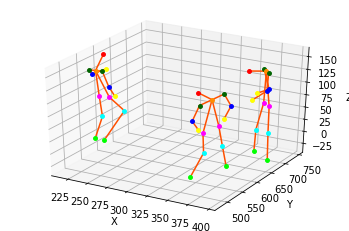

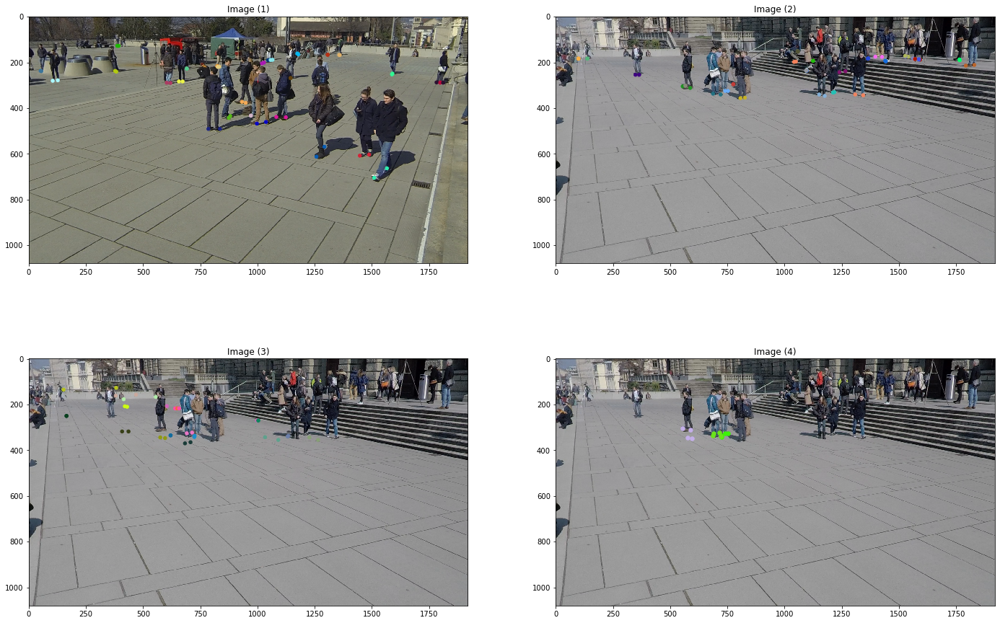

pts3D_13.shape (4, 91)


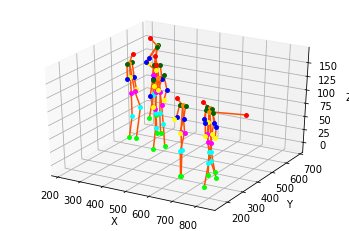

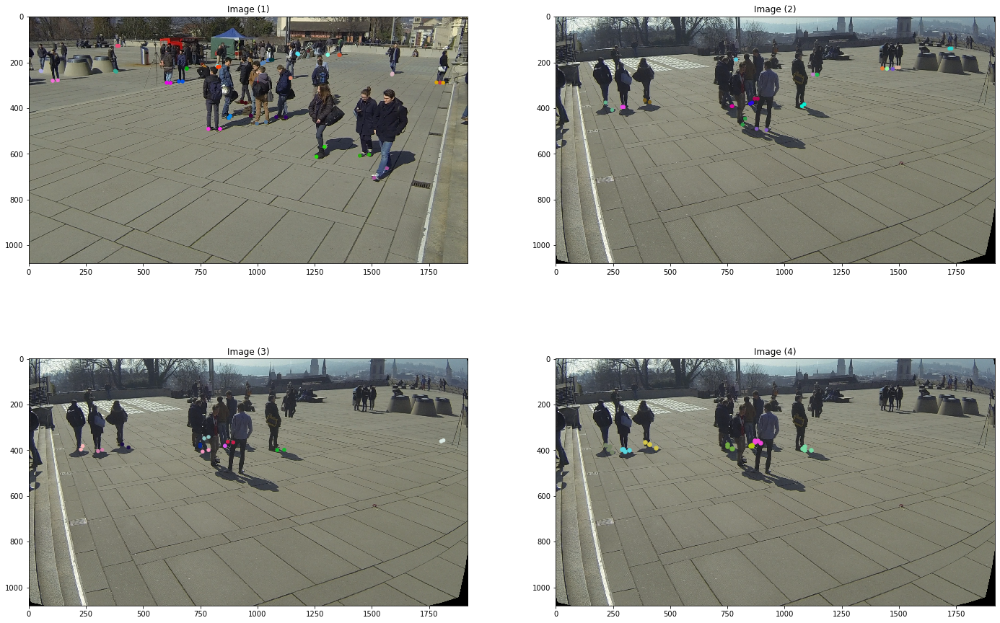

pts3D_13.shape (4, 13)


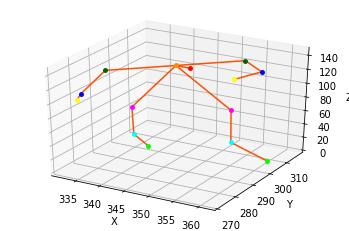

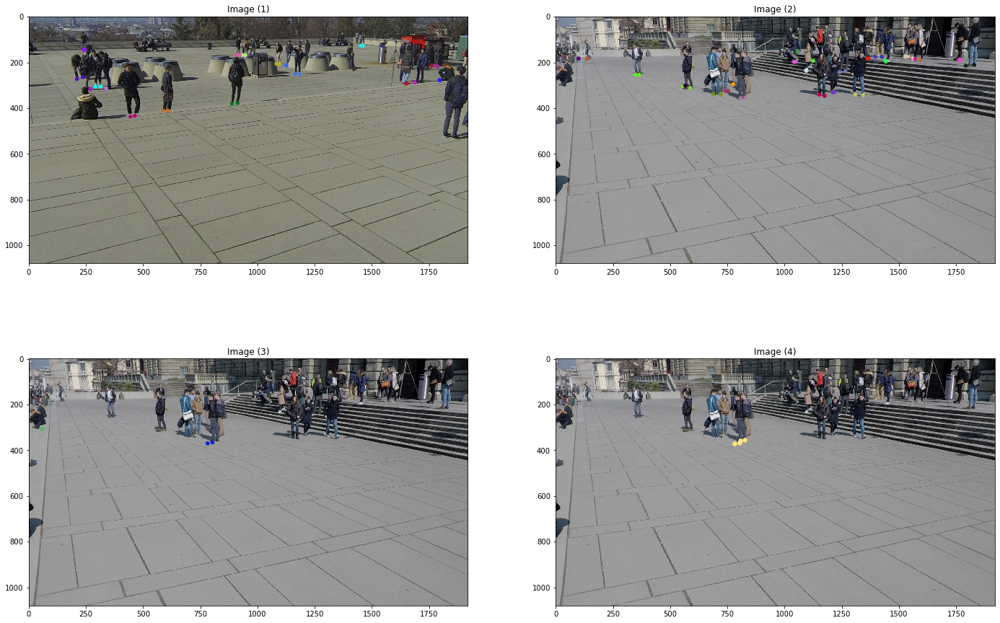

pts3D_13.shape (4, 13)


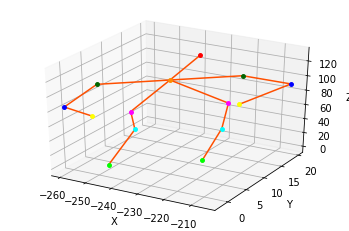

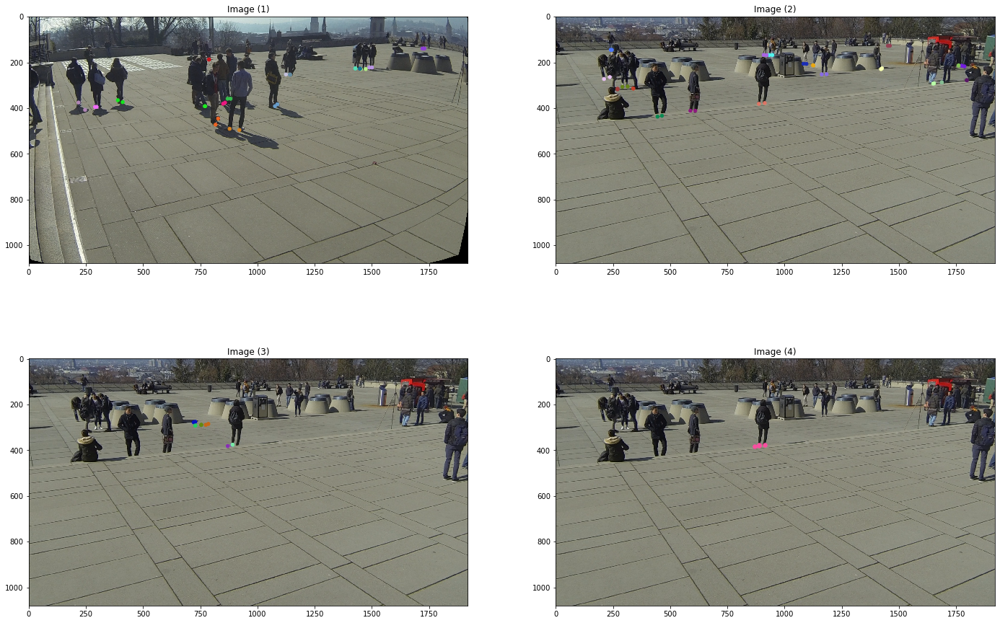

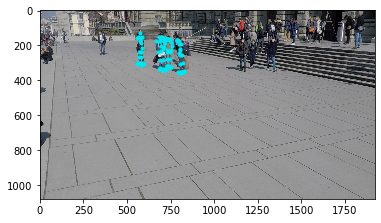

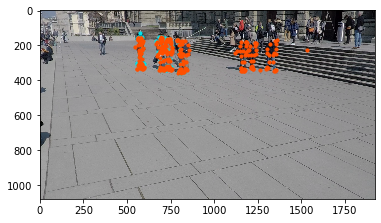

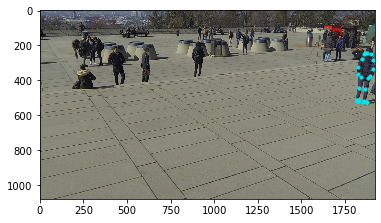

...

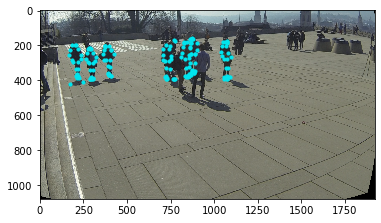

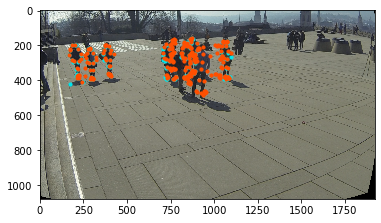

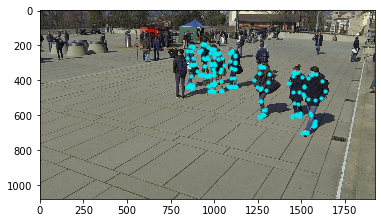

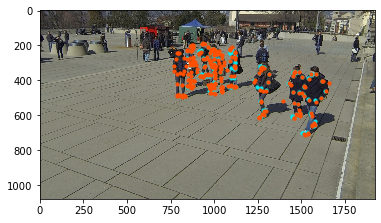

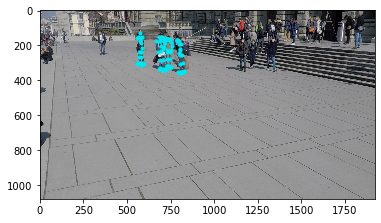

In [19]:
%matplotlib inline
if __name__ == '__main__':
      
    dataset_name = 'WildTrack'
    frame_num = 1690
    xlim, ylim, zlim = [0,7], [14,30], [-0.2,3]
    
    path_c1, path_c6, image_path_c1, image_path_c6, json_3d_path, P1, P6, H16, Width, Height = accomoAllWildtrack(1,6)
    edge_thresh = 50
    hung_thresh = 0.15
    KP1_16, KP6_16, pts3D_16 = main(path_c1, path_c6, image_path_c1, image_path_c6, frame_num, H16, dataset_name,P1,P6, hung_thresh, edge_thresh)
    
    
    path_c1, path_c3, image_path_c1, image_path_c3, json_3d_path, P1, P3, H13, Width, Height = accomoAllWildtrack(1,3)
    edge_thresh = 50
    hung_thresh = 0.15
    KP1_13, KP3_13, pts3D_13 = main(path_c1, path_c3, image_path_c1, image_path_c3, frame_num, H13, dataset_name,P1,P3, hung_thresh, edge_thresh)
    
    
    path_c4, path_c6, image_path_c4, image_path_c6, json_3d_path, P4, P6, H46, Width, Height = accomoAllWildtrack(4,6)
    edge_thresh = 50
    hung_thresh = 0.15
    KP4_46, KP6_46, pts3D_46 = main(path_c4, path_c6, image_path_c4, image_path_c6, frame_num, H46, dataset_name,P4,P6, hung_thresh, edge_thresh)
    
    
    path_c3, path_c4, image_path_c3, image_path_c4, json_3d_path, P3, P4, H34, Width, Height = accomoAllWildtrack(3,4)  
    edge_thresh = 50
    hung_thresh = 0.15
    KP3_34, KP4_34, pts3D_34 = main(path_c3, path_c4, image_path_c3, image_path_c4, frame_num, H34, dataset_name,P3,P4, hung_thresh, edge_thresh)
    
    save_path = './intermediate_result_vis/' + dataset_name + '/test_1/'
    if not os.path.exists(save_path):
        os.makedirs(save_path)
        
    pts3D_new0 = np.concatenate((pts3D_16,pts3D_46),axis = 1)

    pts3D_new = MergeArray(pts3D_new0.copy(),100)   
    
    pts3D_new0 = np.concatenate((pts3D_new.copy(),pts3D_13),axis = 1)
    
    pts3D_new = MergeArray(pts3D_new0.copy(),100)   
    

    KP1,KP6,KP1_0,KP6_0 = VisReprojectionError_All(image_path_c1, image_path_c3, image_path_c4, image_path_c6, frame_num, KP1_16, KP6_16,KP1_13, KP3_13, KP4_46, KP6_46,  KP3_34, KP4_34, pts3D_new, pts3D_new, pts3D_new, pts3D_new, save_path,P1,P3,P4,P6)
    
    
   

# Rotatable 3D Plot

<IPython.core.display.Javascript object>


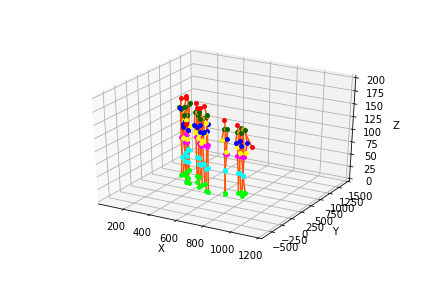

pts3D_13.shape (4, 143)


In [13]:
%matplotlib notebook


f2 = pl.figure(700)
ax = f2.add_subplot(111, projection='3d')
xlim, ylim, zlim = [30,1200], [-700,1500], [0,200]
pts3D_13_s = VisualizeAll3D(pts3D_new.copy(),ax,dataset_name,xlim,ylim,zlim)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_zlim(zlim)

plt.show()

# Visualization of Reprojection

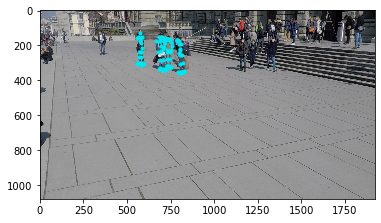

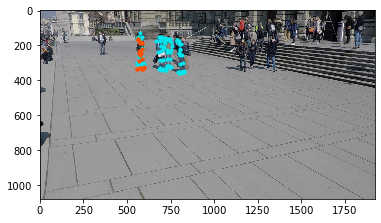

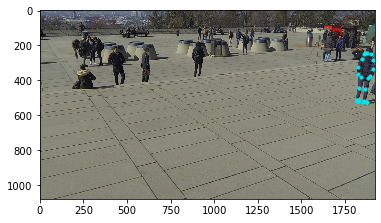

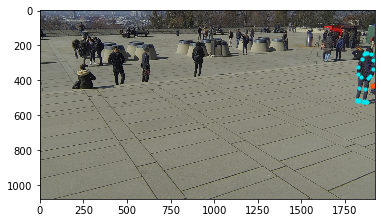

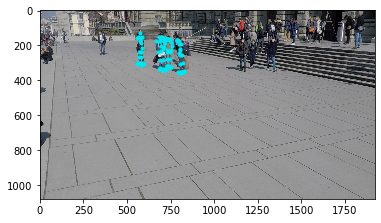

...

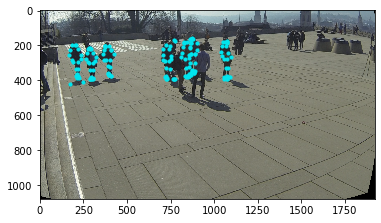

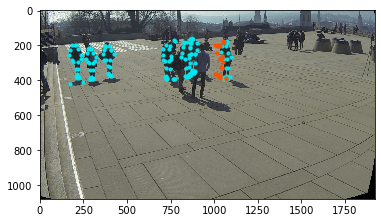

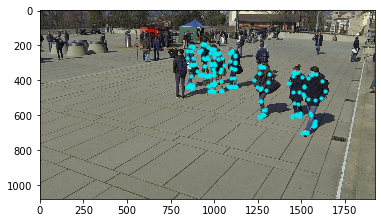

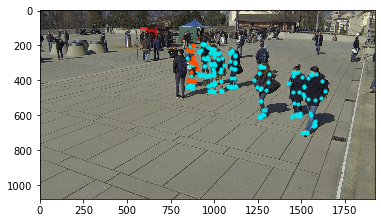

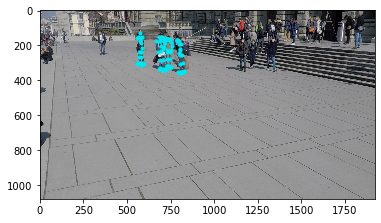

In [14]:
%matplotlib inline
pts3D_new0 = np.concatenate((pts3D_16,pts3D_46),axis = 1)
counter = 2
start = counter*23
end = start+23
pts3D_new = MergeArray(pts3D_new0.copy()[:,0:23],100)

KP1,KP6,KP1_0,KP6_0 = VisReprojectionError_All(image_path_c1, image_path_c3, image_path_c4, image_path_c6, frame_num, KP1_16, KP6_16,KP1_13, KP3_13, KP4_46, KP6_46,  KP3_34, KP4_34, pts3D_new, pts3D_new, pts3D_new, pts3D_new, save_path,P1,P3,P4,P6)
